In [1]:
!pip3 install pyYAML==5.1

# To Change
!python3 -m pip install torch==1.7.1 torchvision==0.8.2 torchaudio==0.7.2

!python3 -m pip install detectron2 -f \
  https://dl.fbaipublicfiles.com/detectron2/wheels/cu102/torch1.7/index.html


     |████████████████████████████████| 274 kB 37.8 MB/s 
  Created wheel for pyYAML: filename=PyYAML-5.1-cp37-cp37m-linux_x86_64.whl size=44091 sha256=33d8a3ae2d4713315e1d0bb131e596e5d42f0ccca1bf5a8672b8297c6fd9ec25
  Stored in directory: /root/.cache/pip/wheels/77/f5/10/d00a2bd30928b972790053b5de0c703ca87324f3fead0f2fd9
Successfully built pyYAML
  Attempting uninstall: pyYAML
    Found existing installation: PyYAML 3.13
    Uninstalling PyYAML-3.13:
      Successfully uninstalled PyYAML-3.13
     |████████████████████████████████| 776.8 MB 17 kB/s 
     |████████████████████████████████| 12.8 MB 22 kB/s 
     |████████████████████████████████| 7.6 MB 40.1 MB/s 
  Attempting uninstall: torch
    Found existing installation: torch 1.9.0+cu102
    Uninstalling torch-1.9.0+cu102:
      Successfully uninstalled torch-1.9.0+cu102
  Attempting uninstall: torchvision
    Found existing installation: torchvision 0.10.0+cu102
    Uninstalling torchvision-0.10.0+cu102:
      Successfully uninst

In [2]:
!pip3 list | grep -i "torch"
!pip3 list | grep -i "cuda"
!pip3 list | grep -i "detectron2"

from google.colab import drive
drive.mount('/content/drive/', force_remount=True)
!pwd && ls


torch                         1.7.1
torchaudio                    0.7.2
torchsummary                  1.5.1
torchtext                     0.10.0
torchvision                   0.8.2
cupy-cuda101                  9.1.0
jaxlib                        0.1.69+cuda110
detectron2                    0.5+cu102
Mounted at /content/drive/
/content
drive  sample_data


In [3]:
!ls

drive  sample_data


In [3]:
import detectron2
import numpy as np
import cv2, os
import random

# Visualize and Config
from detectron2 import model_zoo
from detectron2.engine import DefaultPredictor
from detectron2.config import get_cfg
from detectron2.utils.visualizer import Visualizer
from detectron2.data import MetadataCatalog
from detectron2.data.catalog import DatasetCatalog
from detectron2.data.datasets import register_coco_instances

# Training
from detectron2.data import DatasetMapper, transforms, build_detection_train_loader
from detectron2.engine import DefaultTrainer, SimpleTrainer
from detectron2.engine.hooks import PeriodicWriter

### Visualize the dataset

# Training dataset

In [4]:
training_dataset_name = "grape_dataset"
training_json_loc = "/content/drive/MyDrive/3D Aerospace/grape_leaf_model/annotations.json"
training_img_dir = "/content/drive/MyDrive/3D Aerospace/grape_leaf_model/JPEGImages"
register_coco_instances(training_dataset_name, {}, training_json_loc, training_img_dir)
grape_dataset_train_metadata = MetadataCatalog.get(training_dataset_name)
dataset_dicts = DatasetCatalog.get(training_dataset_name)


Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.



In [9]:
from google.colab import drive
drive.mount('/content/drive/', force_remount=True)

Mounted at /content/drive/


/content/drive/MyDrive/3D Aerospace/grape_leaf_model/JPEGImages/210721_Candie_MER02_Grapes_17.jpg
/content/drive/MyDrive/3D Aerospace/grape_leaf_model/JPEGImages/210611_None_Christophe_I23_img-25474.jpg
/content/drive/MyDrive/3D Aerospace/grape_leaf_model/JPEGImages/210611_None_Christophe_I23_img-25078.jpg
/content/drive/MyDrive/3D Aerospace/grape_leaf_model/JPEGImages/210611_None_Christophe_I23_img-25132.jpg
/content/drive/MyDrive/3D Aerospace/grape_leaf_model/JPEGImages/210611_None_Christophe_I23_img-25512 1.jpg


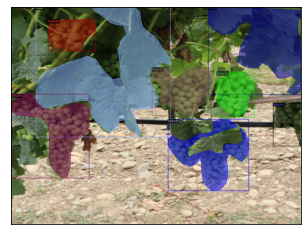

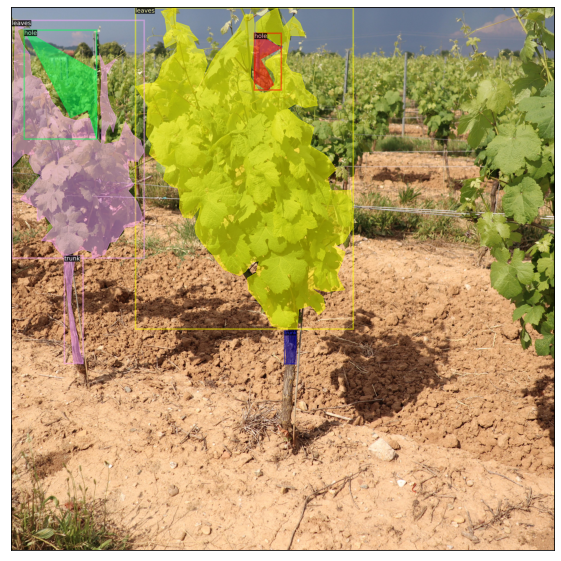

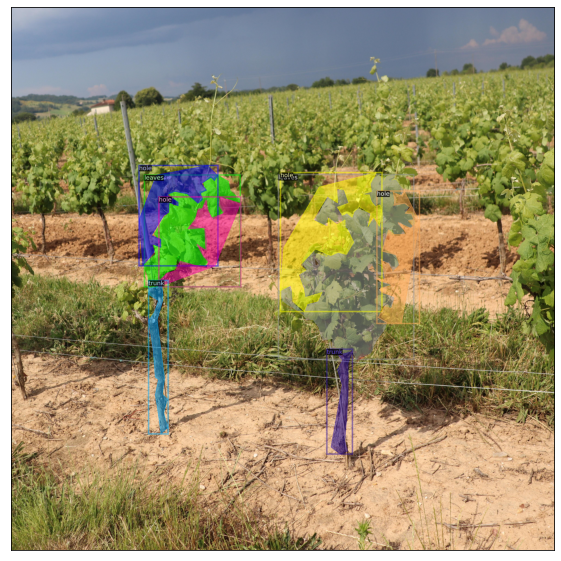

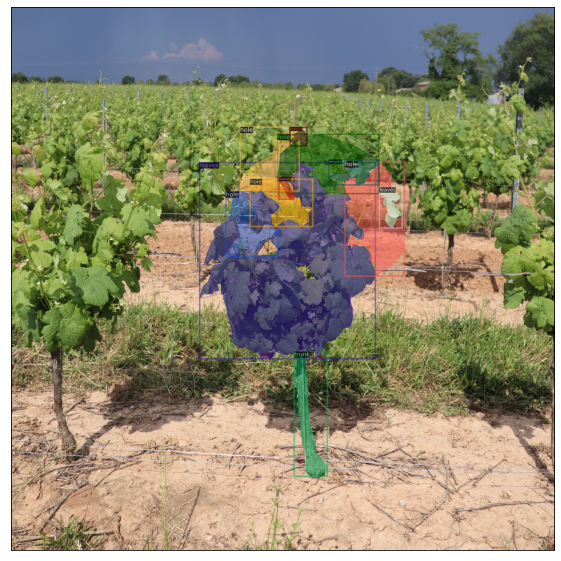

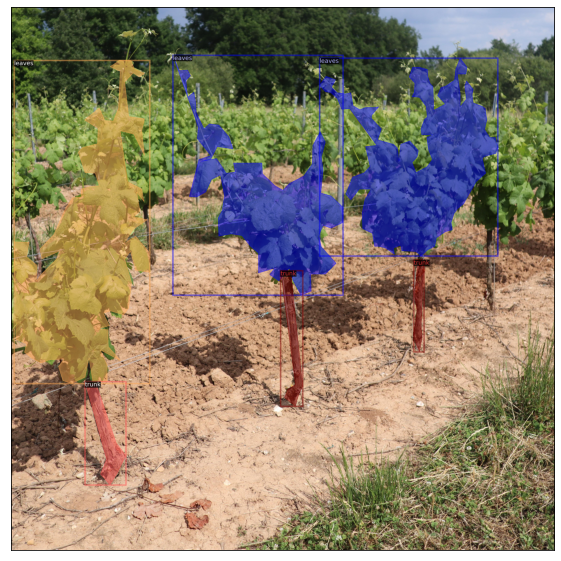

In [5]:
import matplotlib.pyplot as plt
%matplotlib inline
%load_ext tensorboard

samples = random.sample(dataset_dicts, 5)
for i, sample in enumerate(samples):
  img = cv2.imread(sample["file_name"])
  print(sample["file_name"])

  visualizer = Visualizer(img, metadata=grape_dataset_train_metadata)
  visualizer = visualizer.draw_dataset_dict(sample)
  display_img = visualizer.get_image()[:, :, ::-1]
  plt.figure(i+1), plt.xticks([]), plt.yticks([])
  plt.rcParams["figure.figsize"] = (100,10)
  plt.imshow(display_img)

### Generate Training Configuration

In [6]:
from detectron2 import model_zoo
from detectron2.config import get_cfg

model_type = "maskrcnn"
model_file = "COCO-InstanceSegmentation/mask_rcnn_R_50_FPN_3x.yaml"
    
# Create a configuration and set up the model and datasets
cfg = get_cfg()
cfg.merge_from_file(model_zoo.get_config_file(model_file))
cfg.DATASETS.TRAIN = (training_dataset_name,)
cfg.OUTPUT_DIR = f"{model_type}_training_output"
cfg.DATALOADER.NUM_WORKERS = 4
cfg.MODEL.ROI_HEADS.NUM_CLASSES = len(grape_dataset_train_metadata.thing_classes)
cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.05
cfg.MODEL.WEIGHTS = model_zoo.get_checkpoint_url(model_file)  # Initialize weights from Model Zoo
cfg.MODEL.ROI_HEADS.BATCH_SIZE_PER_IMAGE = 256   # (default: 512)

# Solver options
cfg.SOLVER.BASE_LR = 1e-3           # Base learning rate
cfg.SOLVER.GAMMA = 0.5              # Learning rate decay
cfg.SOLVER.STEPS = (250, 500, 750)  # Iterations at which to decay learning rate
cfg.SOLVER.MAX_ITER = 5000          # Maximum number of iterations
cfg.SOLVER.WARMUP_ITERS = 100       # Warmup iterations to linearly ramp learning rate from zero
cfg.SOLVER.IMS_PER_BATCH = 1        # Lower to reduce memory usage (1 is the lowest)
cfg.INPUT.MIN_SIZE_TRAIN =300

In [7]:
# Custom Trainer class to include custom data augmentations
class Trainer(DefaultTrainer):
    @classmethod
    def build_train_loader(cls, cfg):
        # Set up data augmentation
        augs = [transforms.ResizeShortestEdge(
                    [640, 672, 704, 736, 768, 800],
                     max_size=1333, sample_style="choice"),
                transforms.RandomBrightness(0.8, 1.2),
                transforms.RandomSaturation(0.8, 1.2),
                transforms.RandomFlip(prob=0.5)]
        data_loader = build_detection_train_loader(cfg,
            mapper=DatasetMapper(cfg, is_train=True, 
                                 augmentations=augs))
        return data_loader
    

# Create an output folder and delete any old files
os.makedirs(cfg.OUTPUT_DIR, exist_ok=True)
for fname in os.listdir(cfg.OUTPUT_DIR):
    if "tfevents" in fname:
        os.remove(os.path.join(cfg.OUTPUT_DIR, fname))
        
trainer = Trainer(cfg)

for hook in trainer._hooks:
    if isinstance(hook, PeriodicWriter):
        hook._period = 50
        
# Finally, train the network
trainer.resume_or_load(resume=False)
trainer.train()


[07/29 13:39:01 d2.engine.defaults]: Model:
GeneralizedRCNN(
  (backbone): FPN(
    (fpn_lateral2): Conv2d(256, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output2): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral3): Conv2d(512, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output3): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral4): Conv2d(1024, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output4): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (fpn_lateral5): Conv2d(2048, 256, kernel_size=(1, 1), stride=(1, 1))
    (fpn_output5): Conv2d(256, 256, kernel_size=(3, 3), stride=(1, 1), padding=(1, 1))
    (top_block): LastLevelMaxPool()
    (bottom_up): ResNet(
      (stem): BasicStem(
        (conv1): Conv2d(
          3, 64, kernel_size=(7, 7), stride=(2, 2), padding=(3, 3), bias=False
          (norm): FrozenBatchNorm2d(num_features=64, eps=1e-05)
        )
      )
      (res

model_final_f10217.pkl: 178MB [00:09, 18.7MB/s]                           
Skip loading parameter 'roi_heads.box_predictor.cls_score.weight' to the model due to incompatible shapes: (81, 1024) in the checkpoint but (7, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.cls_score.bias' to the model due to incompatible shapes: (81,) in the checkpoint but (7,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.weight' to the model due to incompatible shapes: (320, 1024) in the checkpoint but (24, 1024) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.box_predictor.bbox_pred.bias' to the model due to incompatible shapes: (320,) in the checkpoint but (24,) in the model! You might want to double check if this is expected.
Skip loading parameter 'roi_heads.mask_head.predictor.weight' to the model due to

[07/29 13:39:14 d2.engine.train_loop]: Starting training from iteration 0


/usr/local/lib/python3.7/dist-packages/detectron2/structures/masks.py:363: UserWarning: This overload of nonzero is deprecated:
	nonzero()
Consider using one of the following signatures instead:
	nonzero(*, bool as_tuple) (Triggered internally at  /pytorch/torch/csrc/utils/python_arg_parser.cpp:882.)
  item = item.nonzero().squeeze(1).cpu().numpy().tolist()
/usr/local/lib/python3.7/dist-packages/detectron2/structures/masks.py:363: UserWarning: This overload of nonzero is deprecated:
	nonzero()
Consider using one of the following signatures instead:
	nonzero(*, bool as_tuple) (Triggered internally at  /pytorch/torch/csrc/utils/python_arg_parser.cpp:882.)
  item = item.nonzero().squeeze(1).cpu().numpy().tolist()
/usr/local/lib/python3.7/dist-packages/detectron2/structures/masks.py:363: UserWarning: This overload of nonzero is deprecated:
	nonzero()
Consider using one of the following signatures instead:
	nonzero(*, bool as_tuple) (Triggered internally at  /pytorch/torch/csrc/utils/python

[07/29 13:39:39 d2.utils.events]:  eta: 0:24:20  iter: 49  total_loss: 2.423  loss_cls: 0.7373  loss_box_reg: 0.8446  loss_mask: 0.6375  loss_rpn_cls: 0.08606  loss_rpn_loc: 0.04035  time: 0.4601  data_time: 0.1865  lr: 0.00049051  max_mem: 1541M
[07/29 13:40:01 d2.utils.events]:  eta: 0:24:24  iter: 99  total_loss: 1.914  loss_cls: 0.4664  loss_box_reg: 0.7905  loss_mask: 0.3943  loss_rpn_cls: 0.09545  loss_rpn_loc: 0.07257  time: 0.4466  data_time: 0.1248  lr: 0.00099001  max_mem: 1541M
[07/29 13:40:25 d2.utils.events]:  eta: 0:25:35  iter: 149  total_loss: 1.698  loss_cls: 0.4453  loss_box_reg: 0.6634  loss_mask: 0.3649  loss_rpn_cls: 0.06843  loss_rpn_loc: 0.06573  time: 0.4591  data_time: 0.1862  lr: 0.001  max_mem: 1541M
[07/29 13:40:50 d2.utils.events]:  eta: 0:25:41  iter: 199  total_loss: 1.508  loss_cls: 0.3248  loss_box_reg: 0.5361  loss_mask: 0.3958  loss_rpn_cls: 0.08618  loss_rpn_loc: 0.05468  time: 0.4659  data_time: 0.2432  lr: 0.001  max_mem: 1541M
[07/29 13:41:12 d2.u

FileNotFoundError: ignored

In [17]:
%tensorboard --logdir maskrcnn_training_output/

<IPython.core.display.Javascript object>

#Training dataset

In [12]:
from detectron2.data.datasets import load_coco_json, register_coco_instances
from detectron2.data import MetadataCatalog

test_dataset_name = "testing_data"
test_json_file =  "/content/drive/MyDrive/3D Aerospace/grape_leaf_model/test_annotations.json"
test_img_dir =  "/content/drive/MyDrive/3D Aerospace/grape_leaf_model/test_images"
register_coco_instances(test_dataset_name, {}, test_json_file, test_img_dir)
test_dict = load_coco_json(test_json_file, test_img_dir,
                dataset_name=test_dataset_name)
test_metadata = MetadataCatalog.get(test_dataset_name)

WARNING [07/29 14:57:12 d2.data.datasets.coco]: 
Category ids in annotations are not in [1, #categories]! We'll apply a mapping for you.

[07/29 14:57:12 d2.data.datasets.coco]: Loaded 8 images in COCO format from /content/drive/MyDrive/3D Aerospace/grape_leaf_model/test_annotations.json


#**Evaluate the model**

In [14]:
from detectron2.evaluation import COCOEvaluator

# Load weights from the most recent training run
cfg.MODEL.WEIGHTS = os.path.join(cfg.OUTPUT_DIR, "model_final.pth")

# Run the official Detectron2 test evaluator, which returns useful metrics
if model_type == "maskrcnn":
    eval_tasks = ("segm",)
elif model_type == "retinanet":
    eval_tasks = ("bbox",)
# evaluator = COCOEvaluator(test_dataset_name,
#                           tasks=eval_tasks,
#                           distributed=False,
#                           output_dir=f"{model_type}_test_output")
# trainer.test(cfg, trainer.model, evaluators=evaluator)

#Predictor


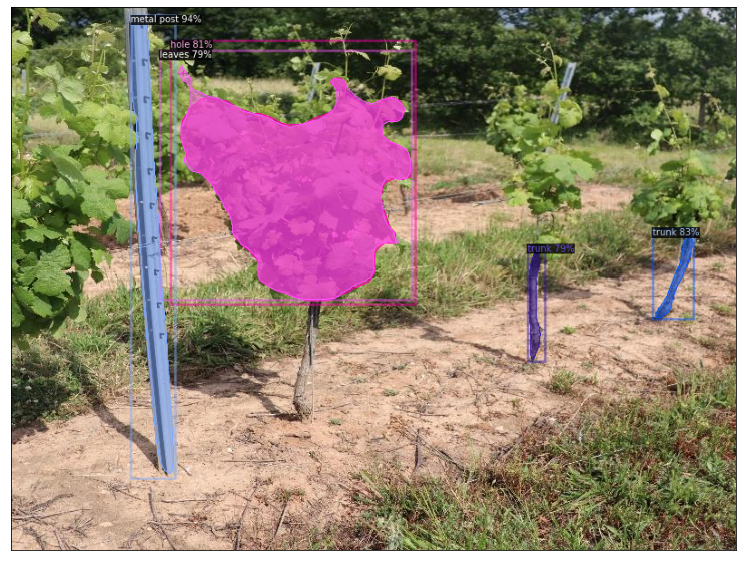

In [18]:
if "trainer" in locals():
    del(trainer) # Free up memory just in case

# Change the prediction score threshold to a bigger value (e.g. 75%)
if model_type == "maskrcnn":
    cfg.MODEL.ROI_HEADS.SCORE_THRESH_TEST = 0.75
elif model_type == "retinanet":
    cfg.MODEL.RETINANET.SCORE_THRESH_TEST = 0.75

# Create a predictor using the trained model    
from detectron2.engine import DefaultPredictor
predictor = DefaultPredictor(cfg)

# Show some qualitative results by predicting on test set images
# NUM_TEST_SAMPLES = 8
# samples = random.sample(test_dict, NUM_TEST_SAMPLES)
# for i, sample in enumerate(samples):
# img = cv2.imread(sample["file_name"])
img = cv2.imread("/content/drive/MyDrive/3D Aerospace/grape_leaf_model/test_images/210611_None_Christophe_I23_img-25309.jpg")
outputs = predictor(img)
visualizer = Visualizer(img, metadata=test_metadata)
visualizer = visualizer.draw_instance_predictions(
        outputs["instances"].to("cpu"))
display_img = visualizer.get_image()[:, :, ::-1]
plt.figure(101+i), plt.xticks([]), plt.yticks([])
plt.imshow(display_img)